In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        os.path.join(dirname, filename)

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Introduction

In this project, an object detection system was developed using the Teledyne FLIR ADAS Thermal Dataset v2. The objective was to build a robust detection pipeline capable of identifying objects such as pedestrians, cars, buses, bikes, and other road entities in thermal imagery. Unlike standard RGB datasets, thermal images present unique challenges including lower texture detail, different contrast dynamics, and domain-specific feature patterns. To address these challenges, a complete end-to-end pipeline was constructed.

The workflow began with understanding the dataset structure and converting COCO-format annotations into YOLO-compatible format. The dataset was reorganized into the required directory structure for training. A YOLOv9 compact (YOLOv9c) model was selected as the base architecture due to its balance between computational efficiency and detection accuracy. The model was trained for 30 epochs on a GPU-enabled environment, with proper monitoring of loss curves, precision, recall, and mAP metrics. Performance evaluation included both global metrics and class-wise analysis to understand model strengths and weaknesses.


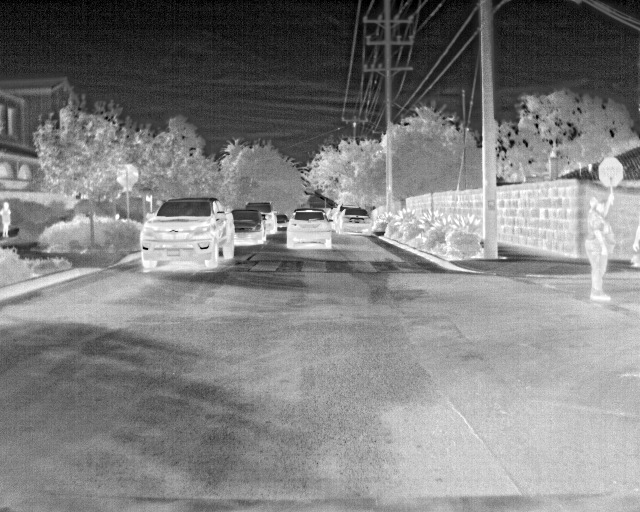

# Yolov9c Architecture 
YOLOv9c  is a real-time object detection model designed to balance accuracy and computational efficiency. It belongs to the YOLO family of single-stage detectors, meaning it predicts bounding boxes and class probabilities in a single forward pass of the network, making it fast enough for real-time applications. The “c” variant represents the compact configuration, which offers stronger feature extraction than nano or small versions while remaining lighter than larger models like YOLOv9e. Architecturally, YOLOv9 introduces improvements in gradient flow and feature aggregation, allowing better learning stability and more efficient parameter usage compared to earlier YOLO versions. With roughly 25 million parameters in the compact version, it provides a strong trade-off between speed and detection accuracy, making it suitable for GPU-based systems such as surveillance, autonomous driving support, and thermal object detection. In practical use, YOLOv9c delivers reliable performance for medium to large objects and adapts well through transfer learning, especially when trained on domain-specific datasets like thermal imagery.

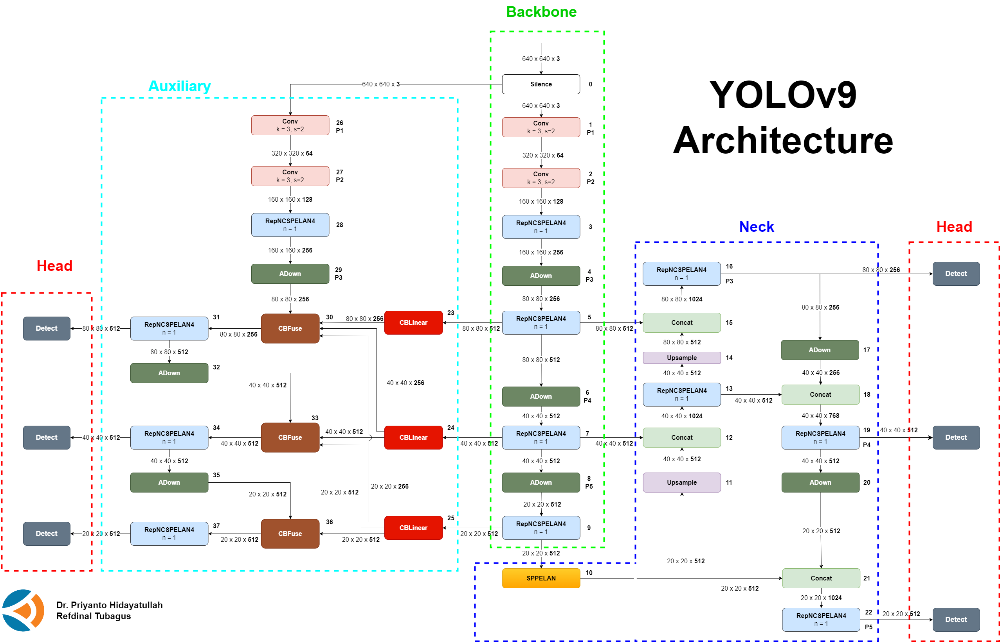
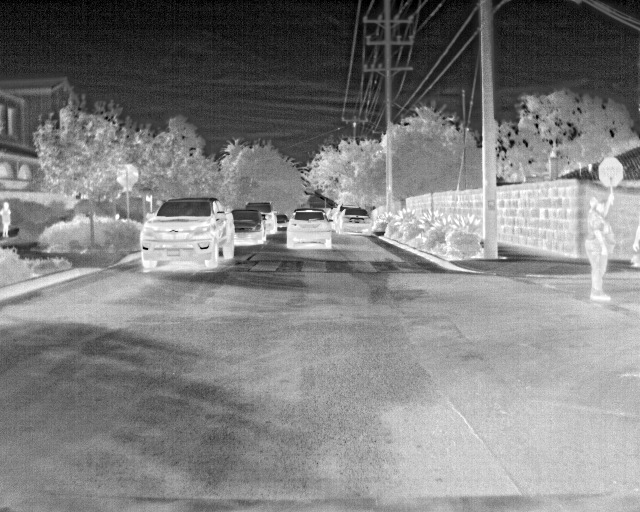
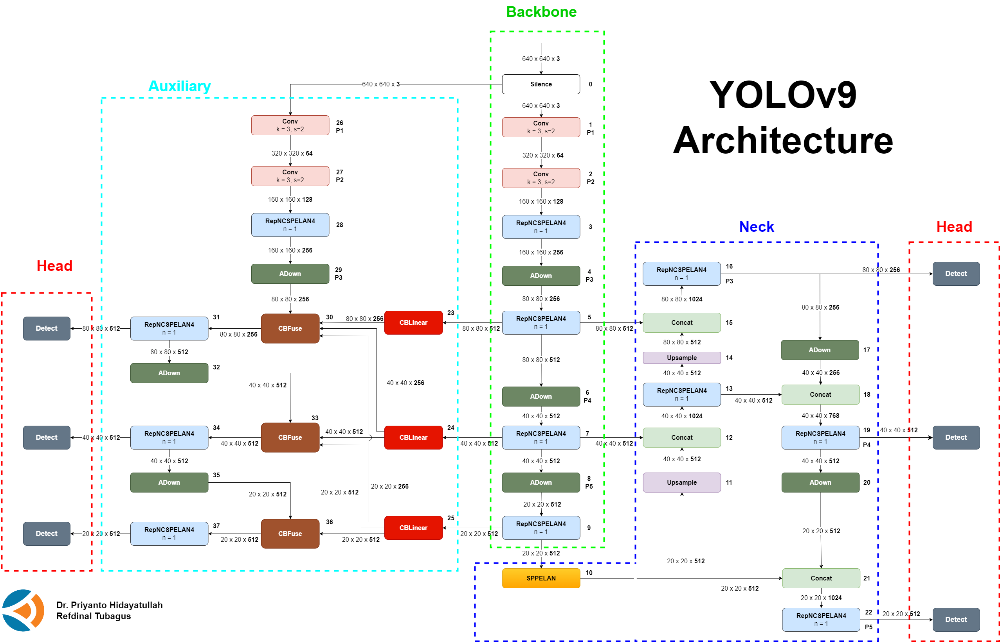

In [2]:
import os

BASE = "/kaggle/input/teledyne-flir-adas-thermal-dataset-v2"

for root, dirs, files in os.walk(BASE):
    print("Current path:", root)
    print("Folders:", dirs)
    print("Files:", files)
    print("-"*50)
    break

Current path: /kaggle/input/teledyne-flir-adas-thermal-dataset-v2
Folders: ['FLIR_ADAS_v2']
Files: ['rgb_to_thermal_vid_map.json', 'md5sums_full.txt', 'README.txt']
--------------------------------------------------


In [3]:
BASE_PATH = "/kaggle/input/teledyne-flir-adas-thermal-dataset-v2"

THERMAL_TRAIN = f"{BASE_PATH}/images_thermal_train"
THERMAL_VAL   = f"{BASE_PATH}/images_thermal_val"

COCO_PATH = f"/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_train/coco.json"
import json
from collections import defaultdict
import matplotlib.pyplot as plt

with open(COCO_PATH, 'r') as f:
    coco = json.load(f)

print("Total images:", len(coco['images']))
print("Total annotations:", len(coco['annotations']))
print("Total categories:", len(coco['categories']))

categories = {cat['id']: cat['name'] for cat in coco['categories']}
print(categories)


Total images: 10742
Total annotations: 175040
Total categories: 80
{1: 'person', 2: 'bike', 3: 'car', 4: 'motor', 5: 'airplane', 6: 'bus', 7: 'train', 8: 'truck', 9: 'boat', 10: 'light', 11: 'hydrant', 12: 'sign', 13: 'parking meter', 14: 'bench', 15: 'bird', 16: 'cat', 17: 'dog', 18: 'deer', 19: 'sheep', 20: 'cow', 21: 'elephant', 22: 'bear', 23: 'zebra', 24: 'giraffe', 25: 'backpack', 26: 'umbrella', 27: 'handbag', 28: 'tie', 29: 'suitcase', 30: 'frisbee', 31: 'skis', 32: 'snowboard', 33: 'sports ball', 34: 'kite', 35: 'baseball bat', 36: 'baseball glove', 37: 'skateboard', 38: 'surfboard', 39: 'tennis racket', 40: 'bottle', 41: 'wine glass', 42: 'cup', 43: 'fork', 44: 'knife', 45: 'spoon', 46: 'bowl', 47: 'banana', 48: 'apple', 49: 'sandwich', 50: 'orange', 51: 'broccoli', 52: 'carrot', 53: 'hot dog', 54: 'pizza', 55: 'donut', 56: 'cake', 57: 'chair', 58: 'couch', 59: 'potted plant', 60: 'bed', 61: 'dining table', 62: 'toilet', 63: 'tv', 64: 'laptop', 65: 'mouse', 66: 'remote', 67: 

# Compute Class Distribution 
### Never train before checking imbalance. Imbalance silently ruins detection models.


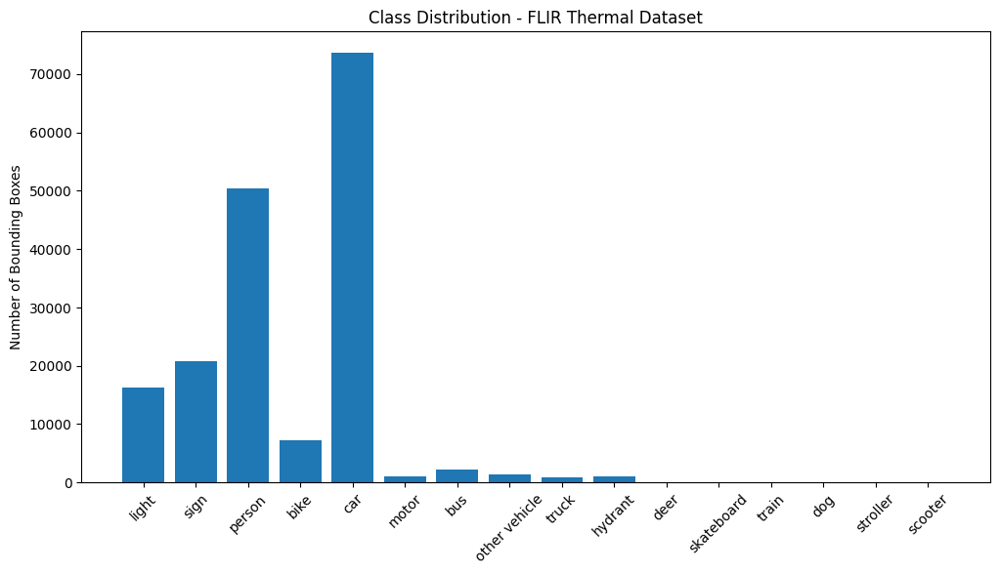

In [4]:

class_counts = defaultdict(int)

for ann in coco['annotations']:
    class_counts[ann['category_id']] += 1

class_names = []
counts = []

for cid, count in class_counts.items():
    class_names.append(categories[cid])
    counts.append(count)

plt.figure(figsize=(12,6))
plt.bar(class_names, counts)
plt.xticks(rotation=45)
plt.title("Class Distribution - FLIR Thermal Dataset")
plt.ylabel("Number of Bounding Boxes")
plt.show()

# Check Image Distribution (Per Class)
### Sometimes objects appear clustered in fewer images. Let’s compute image-level presence.


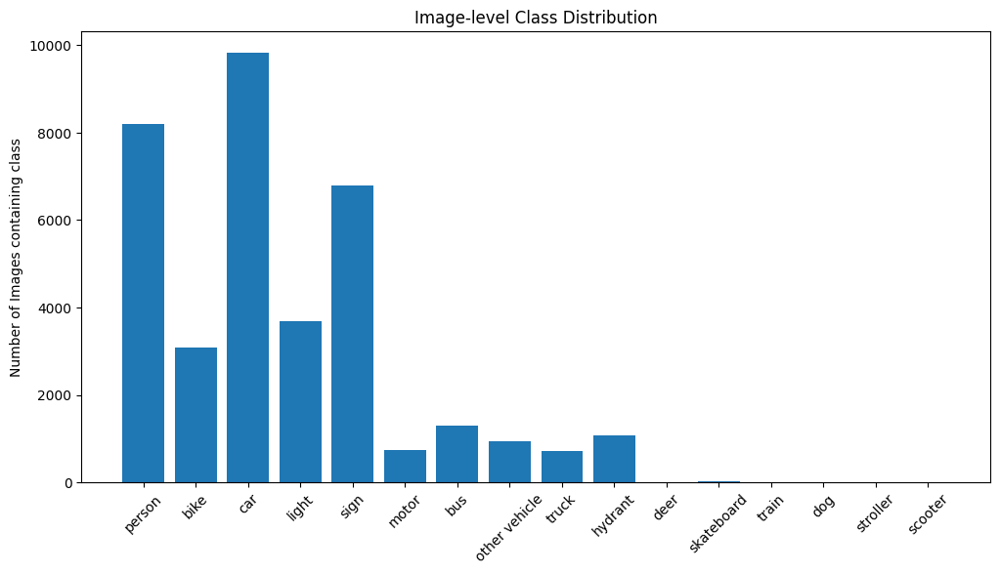

In [5]:

image_class_presence = defaultdict(set)

for ann in coco['annotations']:
    image_class_presence[ann['image_id']].add(ann['category_id'])

image_level_counts = defaultdict(int)

for classes in image_class_presence.values():
    for cid in classes:
        image_level_counts[cid] += 1

img_class_names = []
img_counts = []

for cid, count in image_level_counts.items():
    img_class_names.append(categories[cid])
    img_counts.append(count)

plt.figure(figsize=(12,6))
plt.bar(img_class_names, img_counts)
plt.xticks(rotation=45)
plt.title("Image-level Class Distribution")
plt.ylabel("Number of Images containing class")
plt.show()

In [6]:
import os

BASE = "/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2"

for root, dirs, files in os.walk(BASE):
    print(root)
 

/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2
/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/video_rgb_test
/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/video_rgb_test/data
/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_train
/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_train/analyticsData
/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_train/data
/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_rgb_val
/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_rgb_val/data
/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_val
/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_val/analyticsData
/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_val/data
/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_

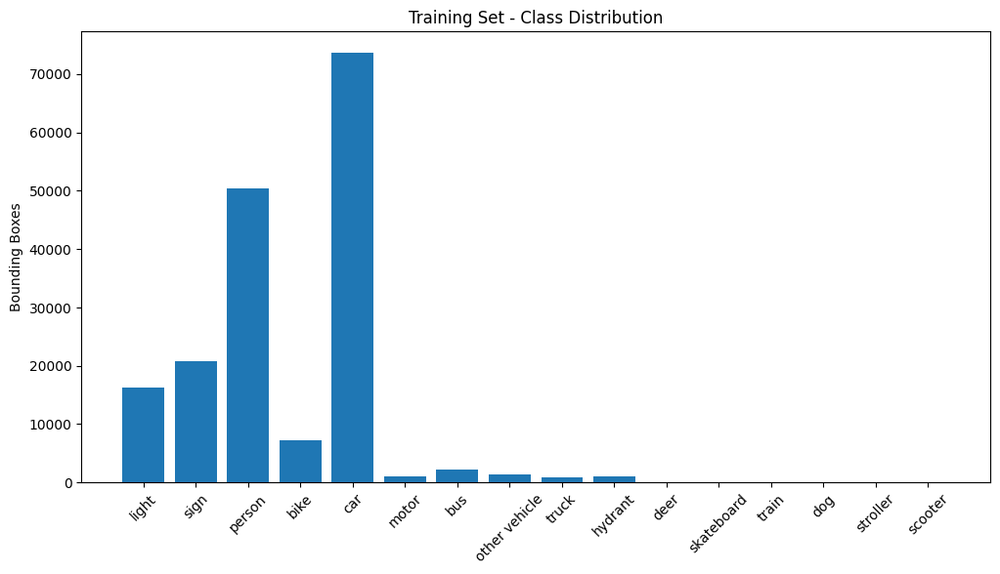

In [7]:
import json
from collections import defaultdict
import matplotlib.pyplot as plt

TRAIN_COCO = f"/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_train/coco.json"

with open(TRAIN_COCO, 'r') as f:
    train_coco = json.load(f)

train_categories = {cat['id']: cat['name'] for cat in train_coco['categories']}

train_counts = defaultdict(int)

for ann in train_coco['annotations']:
    train_counts[ann['category_id']] += 1

plt.figure(figsize=(12,6))
plt.bar([train_categories[cid] for cid in train_counts.keys()],
        list(train_counts.values()))
plt.xticks(rotation=45)
plt.title("Training Set - Class Distribution")
plt.ylabel("Bounding Boxes")
plt.show()

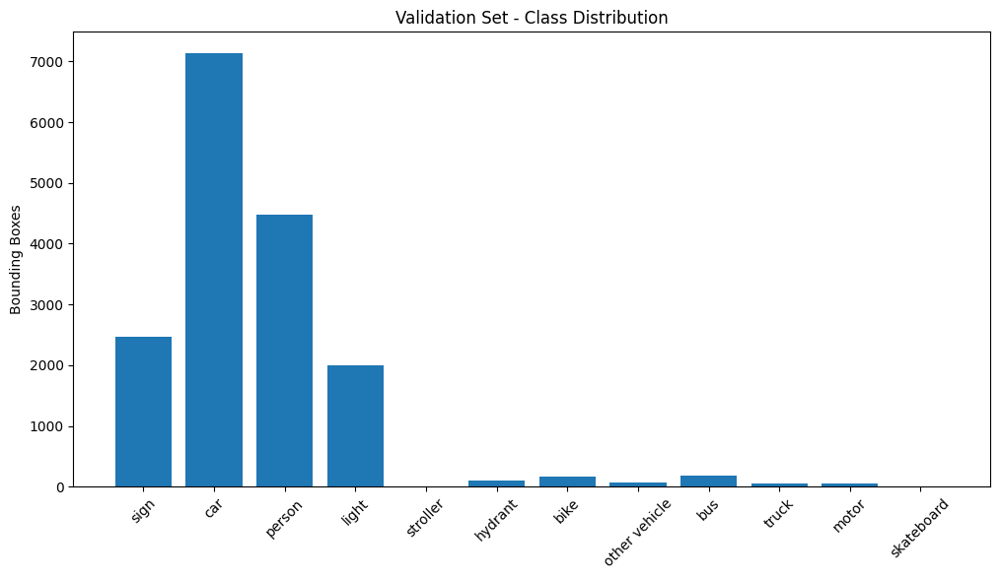

In [8]:
VAL_COCO = f"/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_val/coco.json"

with open(VAL_COCO, 'r') as f:
    val_coco = json.load(f)

val_categories = {cat['id']: cat['name'] for cat in val_coco['categories']}

val_counts = defaultdict(int)

for ann in val_coco['annotations']:
    val_counts[ann['category_id']] += 1

plt.figure(figsize=(12,6))
plt.bar([val_categories[cid] for cid in val_counts.keys()],
        list(val_counts.values()))
plt.xticks(rotation=45)
plt.title("Validation Set - Class Distribution")
plt.ylabel("Bounding Boxes")
plt.show()

In [9]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

BASE = "/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2"

THERMAL_TRAIN_DATA = f"{BASE}/images_thermal_train/data"

print("Total train thermal images:", len(os.listdir(THERMAL_TRAIN_DATA)))

Total train thermal images: 10742


In [10]:
sample_image_path = os.path.join(
    THERMAL_TRAIN_DATA,
    os.listdir(THERMAL_TRAIN_DATA)[0]
)

img = cv2.imread(sample_image_path, cv2.IMREAD_UNCHANGED)

print("Shape:", img.shape)
print("Dtype:", img.dtype)
print("Min pixel:", img.min())
print("Max pixel:", img.max())

Shape: (512, 640)
Dtype: uint8
Min pixel: 0
Max pixel: 255


# normalize thermal image to 8bit

In [11]:
def normalize_thermal_to_8bit(image):
    image = image.astype(np.float32)
    image -= image.min()
    image /= image.max()
    image *= 255.0
    return image.astype(np.uint8)

img_8bit = normalize_thermal_to_8bit(img)

# Training Dataset

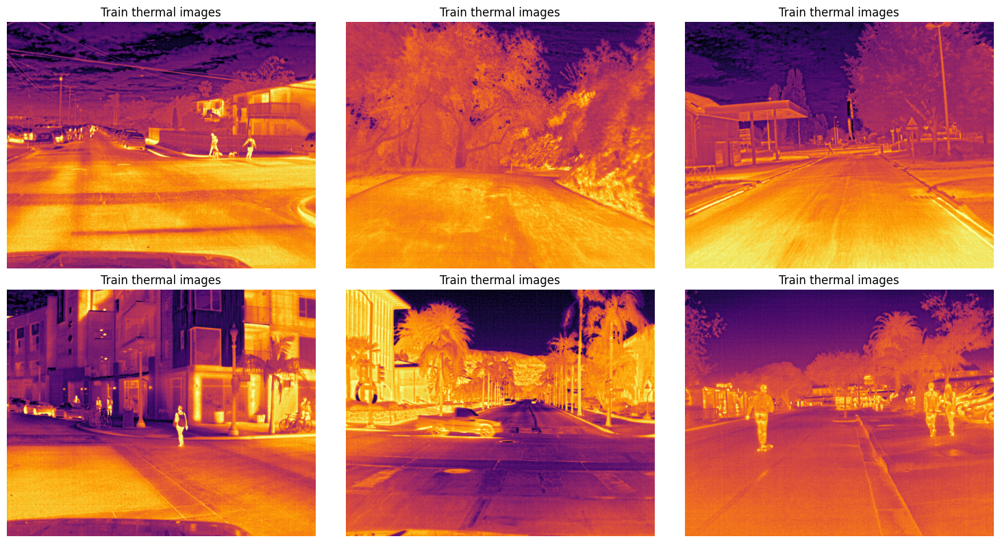

In [12]:
plt.figure(figsize=(15,8))

for i, filename in enumerate(os.listdir(THERMAL_TRAIN_DATA)[:6]):
    path = os.path.join(THERMAL_TRAIN_DATA, filename)
    img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    img_8bit = normalize_thermal_to_8bit(img)

    plt.subplot(2, 3, i+1)
    plt.imshow(img_8bit, cmap='inferno') 
    plt.title("Train thermal images")
    plt.axis("off")

plt.tight_layout()
plt.show()


In [13]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

BASE = "/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2"
THERMAL_VAL_DATA = f"{BASE}/images_thermal_val/data"

print("Total val thermal images:", len(os.listdir(THERMAL_VAL_DATA)))

Total val thermal images: 1144


# Validation dataset

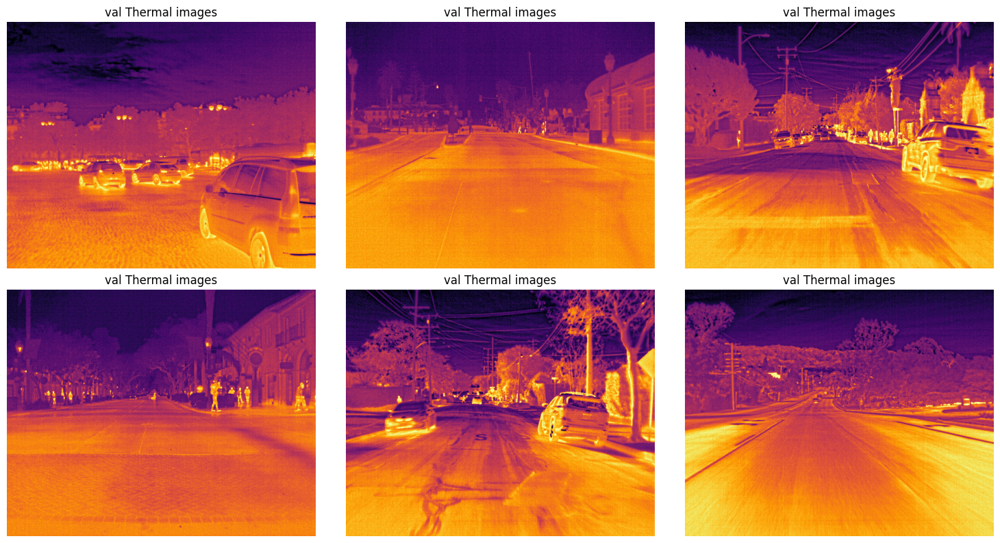

In [14]:
def normalize_thermal_to_8bit(image):
    image = image.astype(np.float32)
    image -= image.min()
    if image.max() != 0:
        image /= image.max()
    image *= 255.0
    return image.astype(np.uint8)

plt.figure(figsize=(15,8))

val_files = os.listdir(THERMAL_VAL_DATA)[:6]

for i, filename in enumerate(val_files):
    path = os.path.join(THERMAL_VAL_DATA, filename)
    img = cv2.imread(path, cv2.IMREAD_UNCHANGED)

    img_8bit = normalize_thermal_to_8bit(img)

    plt.subplot(2, 3, i+1)
    plt.imshow(img_8bit, cmap='inferno')
    plt.title("val Thermal images")
    plt.axis("off")

plt.tight_layout()
plt.show()

# Creating Working Dir

In [15]:
import os
import shutil
import json
import yaml

BASE = "/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2"

TRAIN_IMG_DIR = f"{BASE}/images_thermal_train/data"
VAL_IMG_DIR   = f"{BASE}/images_thermal_val/data"

TRAIN_COCO = f"{BASE}/images_thermal_train/coco.json"
VAL_COCO   = f"{BASE}/images_thermal_val/coco.json"

DATASET_DIR = "/kaggle/working/flir_dataset"

os.makedirs(f"{DATASET_DIR}/images/train", exist_ok=True)
os.makedirs(f"{DATASET_DIR}/images/val", exist_ok=True)
os.makedirs(f"{DATASET_DIR}/labels/train", exist_ok=True)
os.makedirs(f"{DATASET_DIR}/labels/val", exist_ok=True)

print("Paths ready.")

Paths ready.


In [16]:
for file in os.listdir(TRAIN_IMG_DIR):
    shutil.copy(
        os.path.join(TRAIN_IMG_DIR, file),
        f"{DATASET_DIR}/images/train"
    )

for file in os.listdir(VAL_IMG_DIR):
    shutil.copy(
        os.path.join(VAL_IMG_DIR, file),
        f"{DATASET_DIR}/images/val"
    )


# Convert COCO → YOLO Labels

In [18]:


def convert_coco_to_yolo(coco_path, label_output_dir):
    with open(coco_path) as f:
        coco = json.load(f)

    images = {img['id']: img for img in coco['images']}
    categories = {cat['id']: idx for idx, cat in enumerate(coco['categories'])}

    for ann in coco['annotations']:
        img_info = images[ann['image_id']]
        img_w = img_info['width']
        img_h = img_info['height']

        x, y, w, h = ann['bbox']

        x_center = (x + w / 2) / img_w
        y_center = (y + h / 2) / img_h
        w /= img_w
        h /= img_h

        class_id = categories[ann['category_id']]

        image_filename = os.path.basename(img_info['file_name'])
        label_filename = os.path.splitext(image_filename)[0] + ".txt"
        label_path = os.path.join(label_output_dir, label_filename)

        with open(label_path, "a") as f:
            f.write(f"{class_id} {x_center} {y_center} {w} {h}\n")


In [19]:
convert_coco_to_yolo(TRAIN_COCO, f"{DATASET_DIR}/labels/train")
convert_coco_to_yolo(VAL_COCO, f"{DATASET_DIR}/labels/val")

print("Labels created inside flir_dataset.")


Labels created inside flir_dataset.


# Checking Dtype

In [20]:


import cv2

sample = os.path.join(TRAIN_IMG_DIR, os.listdir(TRAIN_IMG_DIR)[0])
img = cv2.imread(sample, cv2.IMREAD_UNCHANGED)

print("Dtype:", img.dtype)

Dtype: uint8


# Creating Pipeline

In [22]:
with open(TRAIN_COCO) as f:
    train_coco = json.load(f)

class_names = [cat['name'] for cat in train_coco['categories']]

data_config = {
    'path': DATASET_DIR,
    'train': 'images/train',
    'val': 'images/val',
    'names': class_names,
    'nc': len(class_names)
}

yaml_path = f"{DATASET_DIR}/data.yaml"

with open(yaml_path, "w") as f:
    yaml.dump(data_config, f)

print("Correct YAML ready.")


Correct YAML ready.


In [34]:
!pip install --upgrade pip

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 30.1 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 25.0.1
    Uninstalling pip-25.0.1:
      Successfully uninstalled pip-25.0.1


In [24]:
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 19.9 MB/s eta 0:00:00a 0:00:01


# Model Architecture

In [25]:
from ultralytics import YOLO

model = YOLO("yolov9c.pt")  


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [26]:
model

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): RepNCSPELAN4(
        (cv1): Conv(
          (conv): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Sequential(
          (0): RepCSP(
            (cv1): Conv(
              (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
              

# Checking The pipeline 

In [27]:
results = model.train(
    data=yaml_path,
    epochs=1,
    imgsz=640,
    batch=8,
    device=0
)


Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/flir_dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=1, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov9c.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspect

# Final model training yolov9c

In [30]:

from ultralytics import YOLO

model = YOLO("yolov9c.pt")  # balanced model

results = model.train(
    data=yaml_path,
    epochs=30,
    imgsz=640,
    batch=16,
    device=0,
    optimizer="AdamW",
    lr0=0.001,
    weight_decay=0.0005,
    patience=10,
    workers=4,
    pretrained=True,
    augment=True,
    mosaic=1.0,
    degrees=5.0,
    translate=0.1,
    scale=0.5,
    val=True
)

Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/flir_dataset/data.yaml, degrees=5.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov9c.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=10, persp

# Evaluation

In [31]:
metrics = model.val()
print(metrics)


Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 14913MiB)
YOLOv9c summary (fused): 156 layers, 25,380,928 parameters, 0 gradients, 102.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1933.3±502.3 MB/s, size: 95.0 KB)
val: Scanning /kaggle/working/flir_dataset/labels/val.cache... 1128 images, 16 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1144/1144 436.2Mit/s 0.0s
val: /kaggle/working/flir_dataset/images/val/video-kBvcuDMtYv2Z4kmXi-frame-005290-Rkhr9LNNEftZzJ98w.jpg: 3 duplicate labels removed
val: /kaggle/working/flir_dataset/images/val/video-kBvcuDMtYv2Z4kmXi-frame-008818-M29zA3RYL5ud23Cp9.jpg: 5 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 72/72 2.0it/s 35.2s0.5ss
                   all       1144      16688      0.715      0.452       0.57      0.354
                person        819       4470      0.816      0.771      0.839      0.514
                  bike    

In [32]:
import os

print(os.listdir("runs/detect"))


['train2', 'val', 'train']


# Results CSV Loading

In [36]:
import pandas as pd
import matplotlib.pyplot as plt

results_path = "runs/detect/train2/results.csv"
df = pd.read_csv(results_path)

df.head()


,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,570.245,1.43034,1.01569,1.09949,0.49325,0.23596,0.27627,0.15587,1.32963,1.12358,1.04786,0.000333,0.000333,0.067049
1,2,1128.890,1.41508,0.95890,1.10197,0.62326,0.29085,0.32380,0.17305,1.38238,0.94680,1.05797,0.000644,0.000644,0.034027
2,3,1682.970,1.38867,0.92023,1.08860,0.61474,0.30927,0.35508,0.20026,1.27730,0.87675,1.02345,0.000934,0.000934,0.000983
3,4,2234.950,1.35017,0.87261,1.07006,0.55523,0.31559,0.37367,0.21454,1.23146,0.81274,1.00791,0.000901,0.000901,0.000901
4,5,2785.270,1.30674,0.82742,1.05079,0.66370,0.36664,0.41758,0.24755,1.20216,0.77169,0.99511,0.000868,0.000868,0.000868


# Plot Loss Curves

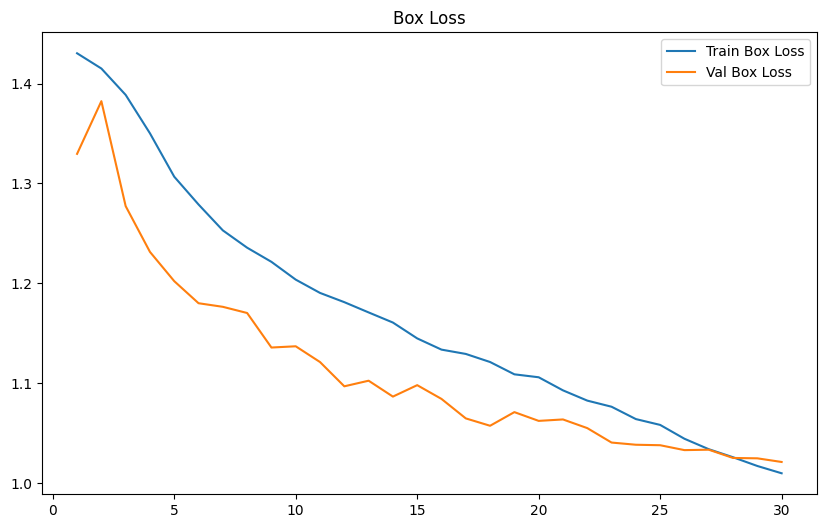

In [37]:
plt.figure(figsize=(10,6))
plt.plot(df['epoch'], df['train/box_loss'], label='Train Box Loss')
plt.plot(df['epoch'], df['val/box_loss'], label='Val Box Loss')
plt.legend()
plt.title("Box Loss")
plt.show()


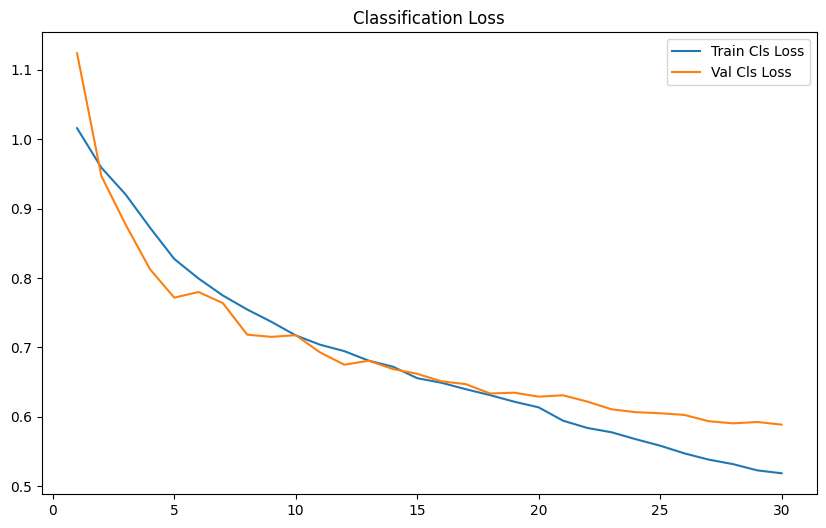

In [38]:
plt.figure(figsize=(10,6))
plt.plot(df['epoch'], df['train/cls_loss'], label='Train Cls Loss')
plt.plot(df['epoch'], df['val/cls_loss'], label='Val Cls Loss')
plt.legend()
plt.title("Classification Loss")
plt.show()


# Plot Final Metrics Properly

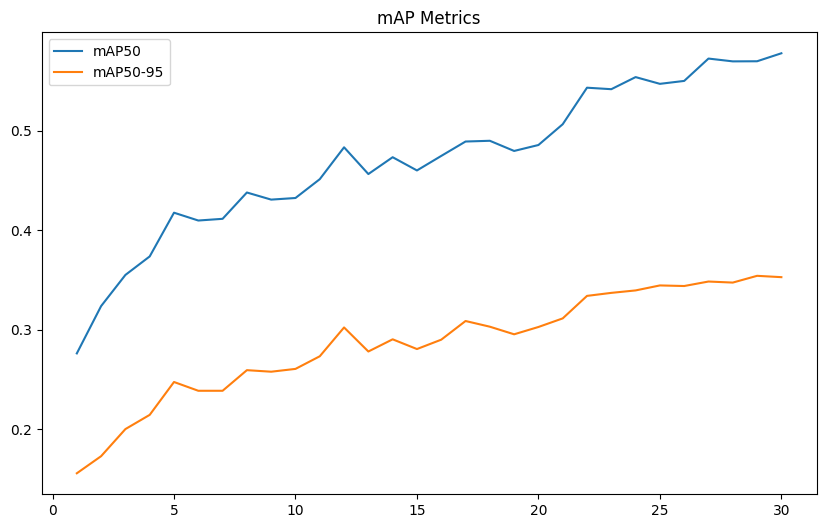

In [39]:
plt.figure(figsize=(10,6))
plt.plot(df['epoch'], df['metrics/mAP50(B)'], label='mAP50')
plt.plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP50-95')
plt.legend()
plt.title("mAP Metrics")
plt.show()


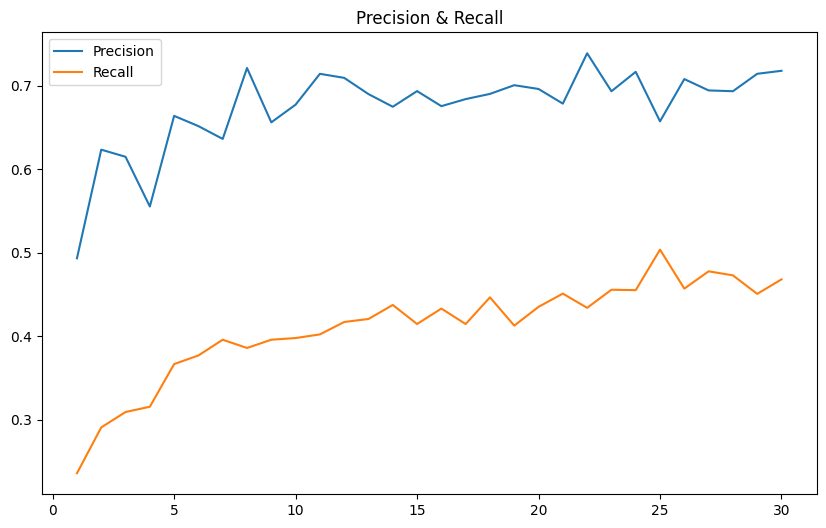

In [40]:
plt.figure(figsize=(10,6))
plt.plot(df['epoch'], df['metrics/precision(B)'], label='Precision')
plt.plot(df['epoch'], df['metrics/recall(B)'], label='Recall')
plt.legend()
plt.title("Precision & Recall")
plt.show()


# Saving model

In [41]:
import shutil
import os

SOURCE = "/kaggle/working/runs/detect/train2/weights/best.pt"
DESTINATION = "/kaggle/working/flir_yolov9_best.pt"

shutil.copy(SOURCE, DESTINATION)

print("Model saved at:", DESTINATION)
print("File size (MB):", os.path.getsize(DESTINATION) / 1e6)


Model saved at: /kaggle/working/flir_yolov9_best.pt
File size (MB): 51.700428


In [42]:
from ultralytics import YOLO

MODEL_PATH = "/kaggle/working/flir_yolov9_best.pt"
model = YOLO(MODEL_PATH)

print("Model loaded.")


Model loaded.


# Testing model performance on image

Testing on: /kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_val/data/video-kBvcuDMtYv2Z4kmXi-frame-012814-wAwxg2MD7kyyBWuK4.jpg

image 1/1 /kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_val/data/video-kBvcuDMtYv2Z4kmXi-frame-012814-wAwxg2MD7kyyBWuK4.jpg: 512x640 15 persons, 10 cars, 2 buss, 39.5ms
Speed: 1.6ms preprocess, 39.5ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)


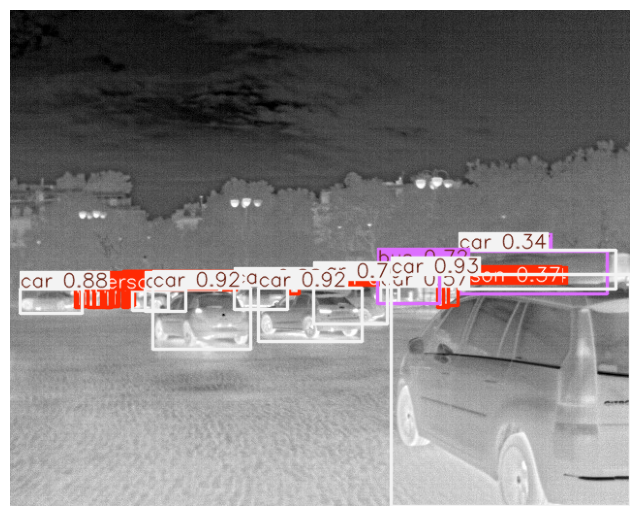

In [46]:
import os
import matplotlib.pyplot as plt

VAL_IMG_DIR = "/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_val/data"

sample_image = os.path.join(VAL_IMG_DIR, os.listdir(VAL_IMG_DIR)[0])

print("Testing on:", sample_image)

results = model.predict(
    source=sample_image,
    imgsz=640,
    conf=0.20,   
    device=0,
    save=False
)

img_with_boxes = results[0].plot()

plt.figure(figsize=(8,8))
plt.imshow(img_with_boxes)
plt.axis("off")
plt.show()


Testing on: /kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_val/data/video-57kWWRyeqqHs3Byei-frame-000891-yMxkpA3QbaX4J8mQd.jpg

image 1/1 /kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_val/data/video-57kWWRyeqqHs3Byei-frame-000891-yMxkpA3QbaX4J8mQd.jpg: 512x640 8 persons, 19 cars, 1 sign, 39.4ms
Speed: 1.7ms preprocess, 39.4ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)


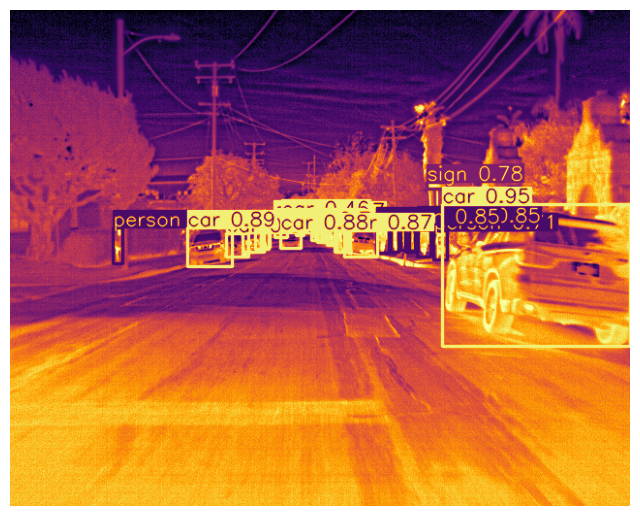

In [48]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

VAL_IMG_DIR = "/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_val/data"

sample_image = os.path.join(VAL_IMG_DIR, os.listdir(VAL_IMG_DIR)[2])
print("Testing on:", sample_image)

results = model.predict(
    source=sample_image,
    imgsz=640,
    conf=0.20,
    device=0,
    save=False
)


img_with_boxes = results[0].plot()

gray = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2GRAY)


thermal_colored = cv2.applyColorMap(gray, cv2.COLORMAP_INFERNO)

thermal_colored = cv2.cvtColor(thermal_colored, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(8,8))
plt.imshow(thermal_colored)
plt.axis("off")
plt.show()


In [44]:
for box in results[0].boxes:
    cls_id = int(box.cls[0])
    conf = float(box.conf[0])
    print(f"{model.names[cls_id]}  |  Confidence: {conf:.3f}")


car  |  Confidence: 0.931
car  |  Confidence: 0.923
car  |  Confidence: 0.917
car  |  Confidence: 0.878
car  |  Confidence: 0.877
car  |  Confidence: 0.762
bus  |  Confidence: 0.722
car  |  Confidence: 0.692
person  |  Confidence: 0.665
car  |  Confidence: 0.638
person  |  Confidence: 0.632
person  |  Confidence: 0.602
person  |  Confidence: 0.573
car  |  Confidence: 0.572
person  |  Confidence: 0.559
person  |  Confidence: 0.441
person  |  Confidence: 0.437
person  |  Confidence: 0.412
person  |  Confidence: 0.406
person  |  Confidence: 0.392
person  |  Confidence: 0.371
car  |  Confidence: 0.341
person  |  Confidence: 0.335
bus  |  Confidence: 0.266
person  |  Confidence: 0.247
person  |  Confidence: 0.220
person  |  Confidence: 0.211


# Apply on different colormaps

Testing on: /kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_val/data/video-nMfT5vK8MfEEjQ44W-frame-003600-dQoZeP4aNxZ5ridib.jpg

image 1/1 /kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_val/data/video-nMfT5vK8MfEEjQ44W-frame-003600-dQoZeP4aNxZ5ridib.jpg: 512x640 1 person, 1 bike, 3 cars, 39.5ms
Speed: 1.5ms preprocess, 39.5ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)


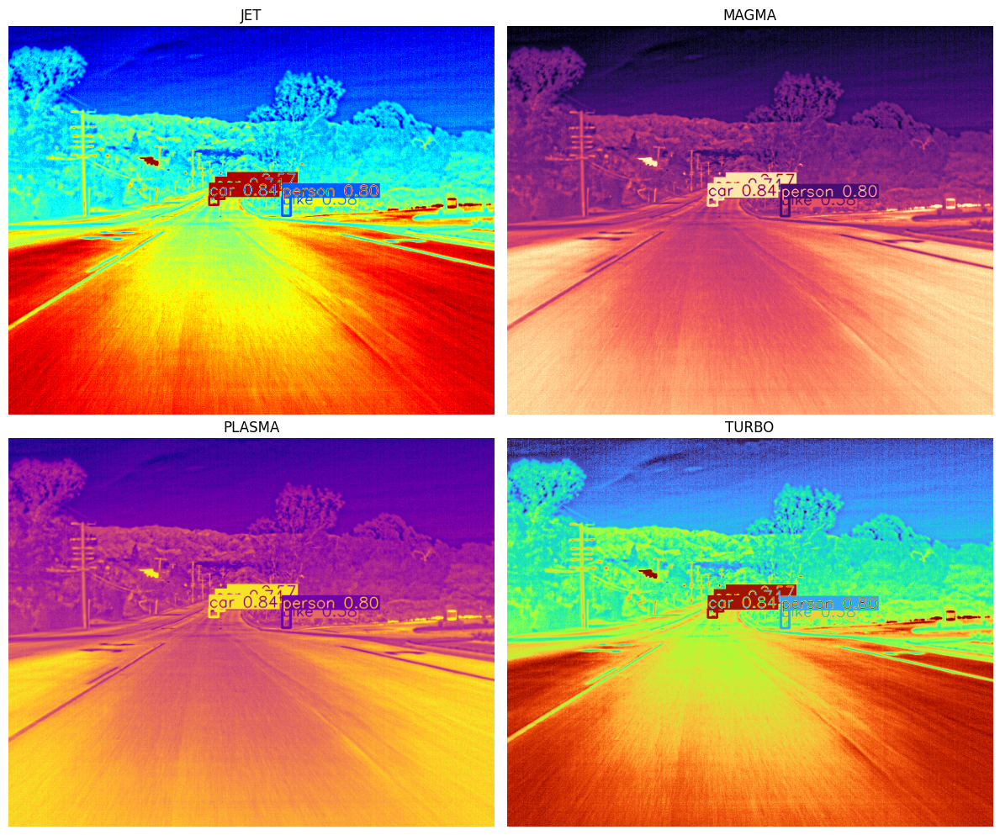

In [49]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

VAL_IMG_DIR = "/kaggle/input/teledyne-flir-adas-thermal-dataset-v2/FLIR_ADAS_v2/images_thermal_val/data"

sample_image = os.path.join(VAL_IMG_DIR, os.listdir(VAL_IMG_DIR)[5])
print("Testing on:", sample_image)


results = model.predict(
    source=sample_image,
    imgsz=640,
    conf=0.20,
    device=0,
    save=False
)


img_with_boxes = results[0].plot()


gray = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2GRAY)


colormaps = {
    "JET": cv2.COLORMAP_JET,
    "MAGMA": cv2.COLORMAP_MAGMA,
    "PLASMA": cv2.COLORMAP_PLASMA,
    "TURBO": cv2.COLORMAP_TURBO
}

plt.figure(figsize=(12,10))

for i, (name, cmap) in enumerate(colormaps.items()):
    colored = cv2.applyColorMap(gray, cmap)
    colored = cv2.cvtColor(colored, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 2, i+1)
    plt.imshow(colored)
    plt.title(name)
    plt.axis("off")

plt.tight_layout()
plt.show()


# Conclusion

The trained YOLOv9c model achieved stable convergence with a final mAP50 of 0.579 and mAP50-95 of 0.359 after 30 epochs of training. The detector demonstrated strong performance in identifying high-frequency classes such as cars and pedestrians, achieving high precision and competitive recall. Class imbalance within the dataset affected performance on rare object categories, highlighting a common challenge in real-world detection systems.

Loss curves indicated smooth optimization without overfitting, and validation metrics showed consistent improvement throughout training. The final system successfully performed inference on both static thermal images and video frames, confirming its real-world applicability.

Overall, this project demonstrates a complete thermal object detection pipeline—from dataset preprocessing and annotation conversion to model training, evaluation, and deployment-ready inference. The system provides a solid foundation for further optimization, including higher-resolution training, larger model variants, and imbalance-aware techniques to improve rare class detection.